In [69]:
import os 
import numpy as np 
import pandas as pd 
import scanpy as sc
import anndata
import copy
import desc
import matplotlib.pyplot as pl
# following line ensures the pl plots inline 
%matplotlib inline
import plotly.express as px
from sklearn.metrics import mean_squared_error

In [70]:
from importlib import reload
import GE_functions
reload(GE_functions)

<module 'GE_functions' from '/data/jlu/scSeq_tsukahara/GE_functions.py'>

From 1_scanpy. We discovered that Rtp1 expression is already expressed at substantial levels in iOSN. Hence the change in expression within iOSN and to mOSN is minimal in comaprison to OMP, Gnal...etc of mOSN markers. Here I extend the similar analysis onto Brann dataset that consists of also Global Basal Cells. 

In [277]:
adata_brann = anndata.read_csv('./files/GSE151346_MOE_all_counts.csv')
meta_data = pd.read_table('./files/GSE151346_MOE_metadata.tsv')
meta_data = meta_data.set_index('index')
# transpose used to flip obs and vars.
adata_brann = adata_brann.copy().transpose()

In [305]:
# Subset the adata by only cells included in metadata. Attach meta info onto adata
adata_brann = adata_brann[meta_data.index, :]
adata_brann.obs = adata_brann.obs.join(meta_data).dropna(axis = 0)

In [308]:
# Subset the adata by interested cells. 
interested_cells = ['mOSN', 'iOSN', 'GBC']
interested_cells_id = adata_brann.obs.leiden_name.isin(interested_cells)
adata_brann = adata_brann[interested_cells_id,:]
# save subsetted anndata for future loading 
adata_brann.raw = adata_brann 
# adata_brann.write('./files/GSE151346_MOE_mOSN_iOSN_GBC_raw.h5ad')

In [ ]:
# Plotting the provided UMAP coordinates on metafile to visualize 
fig = px.scatter(adata_brann.obs, x='UMAP_1', y= 'UMAP_2', color='leiden_name')
fig.update_traces(marker = dict(size = 3, opacity = 0.5))
fig.update_layout({
    'plot_bgcolor': 'rgba(0, 0, 0, 0)',
    })
fig.show()

In [375]:
# normalize to depth 10 000
sc.pp.normalize_per_cell(adata_brann, counts_per_cell_after=1e4)
# logaritmize
sc.pp.log1p(adata_brann)

Trying to set attribute `.obs` of view, copying.


In [376]:
adata_brann.var['mt'] = adata_brann.var_names.str.startswith('Mt') 
adata_brann.var['olfr'] = adata_brann.var_names.str.startswith('Olfr')  
sc.pp.calculate_qc_metrics(adata_brann, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata_brann, qc_vars=['olfr'], percent_top=None, log1p=False, inplace=True)

In [ ]:
sc.set_figure_params(facecolor='White')

In [373]:
# Define genes to be removed from the datasets prior to finding highly variable genes for clustering
mito_genes = adata_brann.var_names.str.startswith('mt-')
olfr_genes = adata_brann.var_names.str.startswith('Olfr')
# malat1 = adata.var_names.str.startswith('Malat')

# Adds the True positions together for a remove list 
remove = np.add(mito_genes, olfr_genes)
# remove = np.add(remove, malat1)
keep = np.invert(remove)

adata_brann = adata_brann[:,keep]
print(adata_brann.n_obs, adata_brann.n_vars)

23102 37106


In [ ]:
# computer and filter data by highly_variabel_genes
sc.pp.highly_variable_genes(adata_brann, min_mean=0.0125, max_mean=3, min_disp=0.5)
# adata_brann = adata_brann[:, adata_brann.var.highly_variable]
# regress out total counts and mt pct 
sc.pp.regress_out(adata_brann, ['total_counts', 'pct_counts_mt'])
sc.pp.scale(adata_brann, max_value=10)
# calculate pca 
sc.tl.pca(adata_brann, svd_solver='arpack')
sc.pp.neighbors(adata_brann, n_neighbors=10, n_pcs=40)
sc.tl.draw_graph(adata_brann)
# calculate umap 
sc.tl.umap(adata_brann)
# adata_brann.write('./files/GSE151346_MOE_mOSN_iOSN_GBC.h5ad')

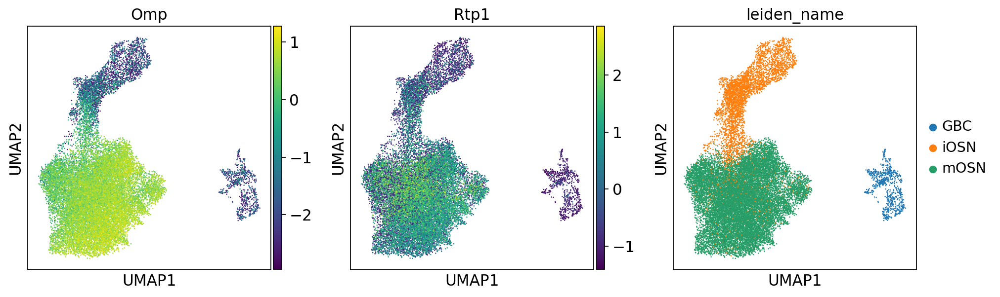

In [155]:
sc.pl.umap(adata_brann, color=['Omp', 'Rtp1','leiden_name'])

In [ ]:
# Clustering PAGA via leiden clustering method
sc.tl.leiden(adata_brann, resolution = 0.5)
sc.tl.paga(adata_brann, groups='leiden')

In [ ]:
sc.pl.draw_graph(adata_brann, color=['leiden'], legend_loc='on data')

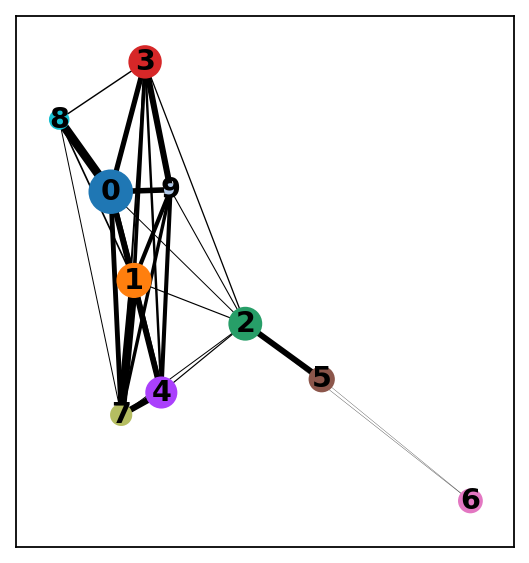

In [382]:
sc.pl.paga(adata_brann, color=['leiden'])

In [ ]:
sc.tl.draw_graph(adata_brann, init_pos='paga')
sc.pl.draw_graph(adata_brann, color=['leiden', 'leiden_name'], legend_loc='on data')
# adata_brann.write('./files/GSE151346_MOE_mOSN_iOSN_GBC.h5ad')

### Read h5ad files here to start. 

In [4]:
# adata_brann.write('./files/GSE151346_MOE_mOSN_iOSN_GBC.h5ad')
# adata_brann = desc.read_h5ad('./files/GSE151346_MOE_mOSN_iOSN_GBC.h5ad')

In [3]:
# adata_brann_gbc_iosn = adata_brann[adata_brann.obs.leiden_name != 'mOSN',:]
# adata_brann_gbc_iosn.write('./files/GSE151346_MOE_iOSN_GBC.h5ad') 
adata_brann = desc.read_h5ad('./files/GSE151346_MOE_iOSN_GBC.h5ad')

In [ ]:
# Using raw data for analysis 
adata_raw = adata_brann.raw.to_adata()
sc.pp.log1p(adata_raw)
# sc.pp.scale(adata_raw)
adata_raw.X
# adata_brann = adata_raw

In [22]:
sc.pp.neighbors(adata_brann, n_neighbors=10, n_pcs=40)
sc.tl.leiden(adata_brann, resolution = 1)
sc.tl.paga(adata_brann, groups='leiden')

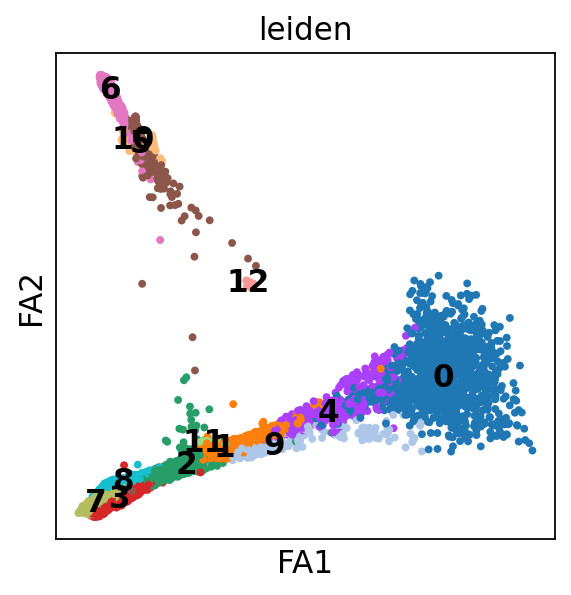

In [23]:
sc.set_figure_params(facecolor='white')
sc.pl.draw_graph(adata_brann, color=['leiden'], legend_loc='on data', size=50)

In [24]:
adata_brann.uns['iroot'] = np.flatnonzero(adata_brann.obs['leiden']  == '6')[0]
sc.tl.dpt(adata_brann)

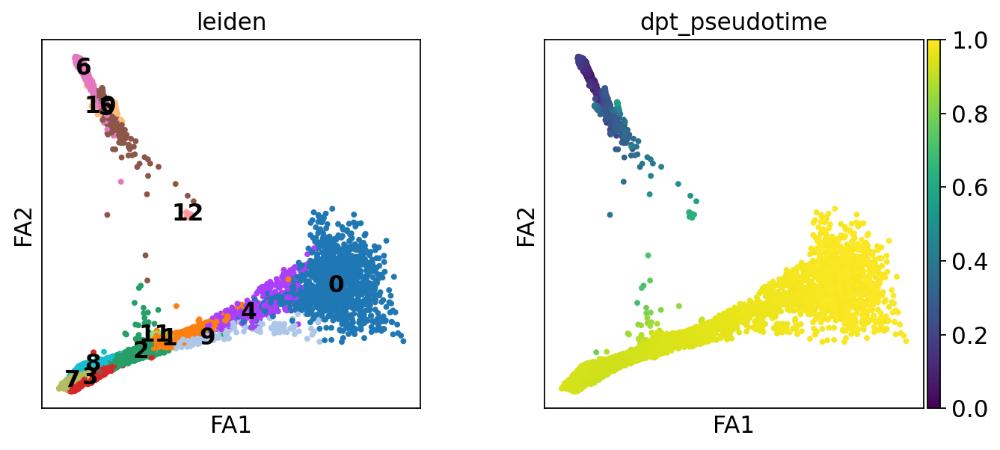

In [25]:
sc.pl.draw_graph(adata_brann, color=['leiden', 'dpt_pseudotime'], legend_loc='on data', size=50)

Now that we have leiden and dpt information for each cell. Copy raw gene data onto the anndata in order normalize and scale to find the genes that are associated with Rtp1 expression 

In [10]:
# construct a gene_names of list of genes to include analysis
# exclude mt- , Rik ... etc 
gene_names = GE_functions.get_gene_names()

Construct ge_table with cells binned together by dpt value cutoffs rather than umap clusters 

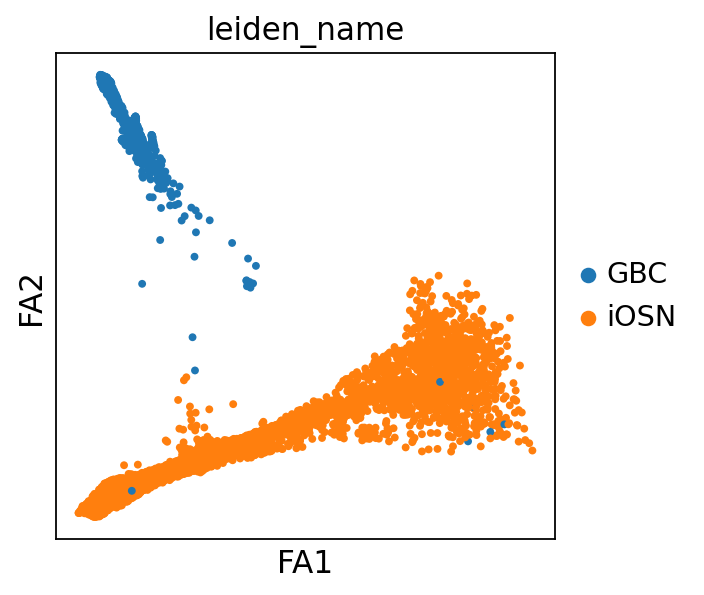

In [27]:
sc.pl.draw_graph(adata_brann, 
                 color=['leiden_name'],
#                  legend_loc='ondata'
                 size = 50
                )

In [124]:
# Creates a column of dpt_bins to group cells by dpt_bins 
# dpt_bins step size can be tuned by adjusting the num slices across 1-0 in np.linespace. 
adata_brann.obs['dpt_bins'] = None 
difference = round(np.linspace(1,0, num = 20)[0] - np.linspace(1,0, num = 20)[1],2)
for dpt_cutoff in np.linspace(1,0, num = 20):
    adata_brann.obs.loc[adata_brann.obs.dpt_pseudotime < dpt_cutoff, 'dpt_bins'] = str(abs(round(dpt_cutoff-difference,2))) +"-"+ str(round(dpt_cutoff,2))

Contruct a selected_dpt by manually determining the cutoffs. The goal is to discretely distinguish mOSN, iOSN, GBC and most importantly the transitioning cells 

In [11]:
# Creates a column of dpt_bins to group cells by dpt_bins 
# dpt_bins step size can be tuned by adjusting the num slices across 1-0 in np.linespace. 
adata_brann.obs['selected_dpt'] = None 
dpt_cutoff = [0,0.5,0.9,0.98,1]
for cutoff in enumerate(dpt_cutoff):
    if not cutoff[1] == 1:
        adata_brann.obs.loc[adata_brann.obs.dpt_pseudotime >= cutoff[1], 'selected_dpt'] = str((cutoff[1])) +"-"+ str(dpt_cutoff[cutoff[0]+1])
#         print(cutoff)
#         print(str((cutoff[1])) +"-"+ str(dpt_cutoff[cutoff[0]+1]))

/data/jlu/anaconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'selected_dpt' as categorical


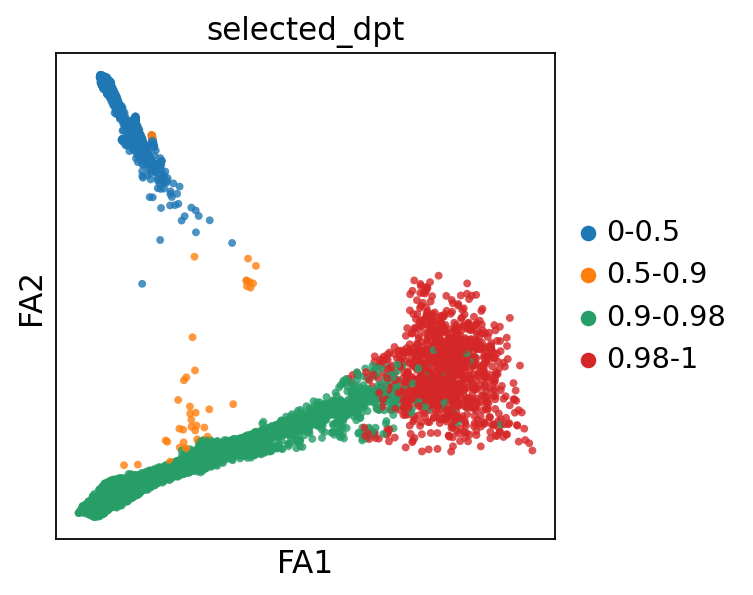

In [29]:
sc.set_figure_params(facecolor='White')
sc.pl.draw_graph(adata_brann, 
                 color=['selected_dpt'],
#                  legend_loc='ondata'
                 size = 50,
                 alpha =0.8
                )

construct a pd dataframe for average gene expression of interest across dpt_bins 


In [40]:
ge_table_gbc_iosn = get_ge_table(adata_brann, gene_names, ge_across='selected_dpt')

Generating mse_table by calculating and filtering genes with lesser mean_square_error by expression bin order in comparison to Rtp1

In [94]:
# ge_table_selected_dpt = pd.read_csv('./output/brann/ge_table_selected_dpt.csv')
# ge_table_selected_dpt.set_index('Unnamed: 0', inplace=True)
# # extract gene_names 
# gene_names = ge_table_selected_dpt.columns[1:len(ge_table_dpt_bin.columns)-1]

In [117]:
# ge_table_dpt_bin = pd.read_csv('./output/brann/ge_table_dpt_bin.csv')
# ge_table_dpt_bin.set_index('Unnamed: 0', inplace=True)

In [191]:
# rtp1_mse = pd.read_csv('./output/brann/MSE_genes_Rtp1_top100.csv').transpose()
# rtp2_mse = pd.read_csv('./output/brann/MSE_genes_Rtp2_top100.csv').transpose()

In [72]:
# generate and filter mse table for plotting 
# relative to rtp1
mse_table = GE_functions.get_mse_table(ge_table, gene_names)
mse_table.transpose().sort_values('mse')[0:100].to_csv('./output/brann/MSE_genes_Rtp1_top100_gbc_iosn.csv')
mse_table = GE_functions.filter_mse_table(mse_table, excluded_genes)

mse_table constructed


In [74]:
# find the position of 'gene' in mse_table 
[i for i, x in enumerate(mse_table.columns == 'Clgn') if x]

[10042]

In [ ]:
# saving line plot as html
fig = GE_functions.expression_line_plot(ge_table, mse_table)
fig = fig.update_layout(title = 'Average gene expression change across selected_dpt relative Rtp1 \n Data from Brann GBC/iOSN homecage')
fig.write_html("./output/brann/ge_line_seleted_dpt_Rtp1.html")
fig

In [ ]:
# generate and filter mse table for plotting 
# relative to rtp2
mse_table = GE_functions.get_mse_table(ge_table, gene_names, mse_gene='Rtp2')
mse_table.transpose().sort_values('mse')[0:100].to_csv('./output/brann/MSE_genes_Rtp2_top100_gbc_iosn.csv')
mse_table = GE_functions.filter_mse_table(mse_table, excluded_genes, mse_gene='Rtp1')

In [ ]:
# saving line plot as html
fig = GE_functions.expression_line_plot(ge_table, mse_table)
fig = fig.update_layout(title = 'Average gene expression change across selected_dpt relative Rtp2 \n Data from Brann GBC/iOSN homecage')
fig.write_html("./output/tsukahara/ge_line_seleted_dpt_Rtp2.html")
fig

Conduct same analysis on GBC iOSN but on unscaled data. In order to not treat all genes with the same weight. 

In [18]:
adata_brann = desc.read_h5ad('./files/GSE151346_MOE_iOSN_GBC.h5ad')
adata_brann = adata_brann.raw.to_adata()

In [19]:
sc.pp.normalize_total(adata_brann, target_sum=1e4)
# sc.pp.log1p(adata_brann)
# sc.pp.scale(adata_brann)

In [20]:
# sc.pp.neighbors(adata_brann, n_neighbors=10, n_pcs=40)
# sc.tl.leiden(adata_brann, resolution = 1)
# sc.tl.paga(adata_brann, groups='leiden')

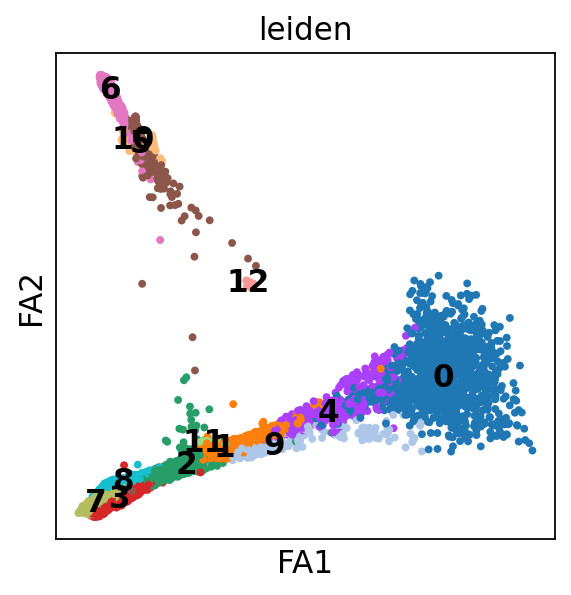

In [21]:
sc.set_figure_params(facecolor='white')
sc.pl.draw_graph(adata_brann, color=['leiden'], legend_loc='on data', size=50)

In [22]:
adata_brann.uns['iroot'] = np.flatnonzero(adata_brann.obs['leiden']  == '6')[0]
sc.tl.dpt(adata_brann)

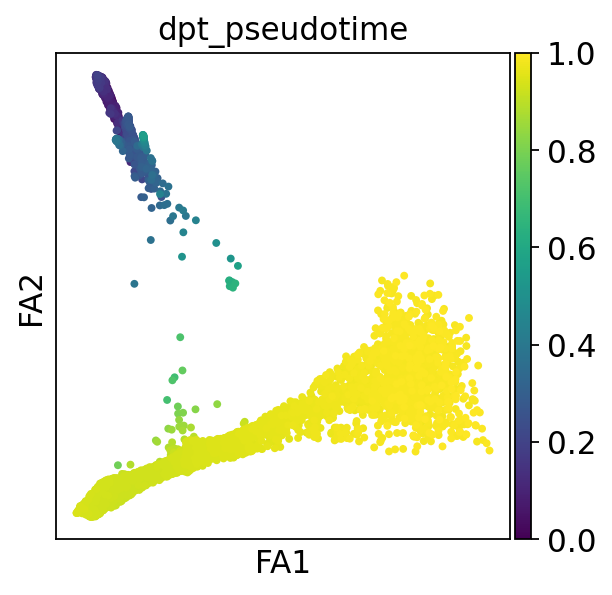

In [23]:
sc.pl.draw_graph(adata_brann, color=['dpt_pseudotime'], legend_loc='on data', size=50)

/data/jlu/anaconda3/envs/scanpy/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'selected_dpt' as categorical


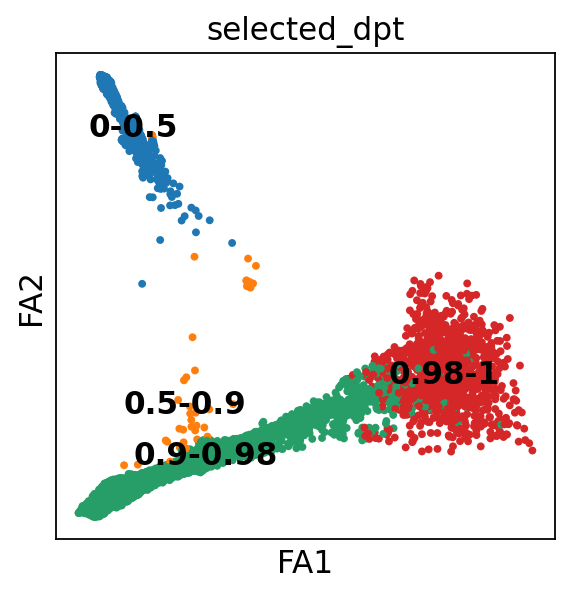

In [27]:
adata_brann = GE_functions.add_selected_dpt(adata_brann)
sc.pl.draw_graph(adata_brann, color=['selected_dpt'], legend_loc='on data', size=50)

In [ ]:
ge_table = GE_functions.get_ge_table(adata_brann, gene_names, ge_across='selected_dpt')
mse_table = GE_functions.get_mse_table(ge_table, gene_names)
mse_table.transpose().sort_values('mse')[0:100].to_csv('./output/brann/MSE_genes_Rtp1_top100_gbc_iosn_ONLYnormalize.csv')
mse_table = GE_functions.filter_mse_table(mse_table, excluded_genes)

In [ ]:
# saving line plot as html
fig = GE_functions.expression_line_plot(ge_table, mse_table)
fig = fig.update_layout(title = 'Average gene expression change across selected_dpt(Only_normalize_counts) relative Rtp1 \n Data from Brann GBC/iOSN homecage')
fig.write_html("./output/brann/ge_line_seleted_dpt_Rtp1_normalizeONLY.html")
fig

In [15]:
# relative to rtp2
ge_table = GE_functions.get_ge_table(adata_brann, gene_names, ge_across='selected_dpt')
mse_table = GE_functions.get_mse_table(ge_table, gene_names, mse_gene='Rtp2')
mse_table.transpose().sort_values('mse')[0:100].to_csv('./output/brann/MSE_genes_Rtp2_top100_gbc_iosn_ONLYnormalize.csv')
mse_table = GE_functions.filter_mse_table(mse_table, excluded_genes, mse_gene='Rtp1')
# saving line plot as html
fig = GE_functions.expression_line_plot(ge_table, mse_table)
fig = fig.update_layout(title = 'Average gene expression change across selected_dpt(Only_normalize_counts) relative Rtp2 \n Data from Brann GBC/iOSN homecage')
fig.write_html("./output/brann/ge_line_seleted_dpt_Rtp2_normalizeONLY.html")
fig

mse_table constructed
16451 genes dropped from mse_table


Since Nomalization shows to have such a difference in gene that's determined to be co-expressed with Rtp1. Plot a scatter plot with x,y axis being mse scores from ONLYnormalized vs scaled. 

In [ ]:
ge_normalized = pd.read_csv('./output/brann/ge_table_selected_dpt_ONLYnormalized.csv')
del ge_normalized['Unnamed: 0']
ge_processed = pd.read_csv('./output/brann/ge_table_selected_dpt.csv')
del ge_processed['Unnamed: 0']

In [127]:
gene_names = GE_functions.get_gene_names(adata_brann)

In [218]:
mse_normalized_rtp1 = GE_functions.get_mse_table(ge_normalized, gene_names)
mse_normalized_rtp2 = GE_functions.get_mse_table(ge_normalized, gene_names, mse_gene="Rtp2")
mse_processed_rtp1 = GE_functions.get_mse_table(ge_processed, gene_names)
mse_processed_rtp2 = GE_functions.get_mse_table(ge_processed, gene_names, mse_gene="Rtp2")

mse_table constructed
mse_table constructed
mse_table constructed
mse_table constructed


In [233]:
mse_combined = mse_normalized_rtp1.transpose().rename(columns = {'mse': 'mse_normalized_rtp1'}).join(
    mse_processed_rtp1.transpose().rename(columns = {'mse': 'mse_processed_rtp1'}))

In [230]:
mse_Rtp1_Rtp2_normalized = mse_normalized_rtp1.transpose().rename(columns = {'mse': 'mse_normalized_rtp1'}).join(
    mse_normalized_rtp2.transpose().rename(columns = {'mse': 'mse_normalized_rtp2'}))
mse_Rtp1_Rtp2_processed = mse_processed_rtp1.transpose().rename(columns = {'mse': 'mse_processed_rtp1'}).join(
    mse_processed_rtp2.transpose().rename(columns = {'mse': 'mse_processed_rtp2'}))

In [ ]:
fig = x_y_scatter(mse_Rtp1_Rtp2_normalized, 
            title = "Rtp1 vs Rtp2 normalized counts")
fig.write_html("./output/brann/Scatter_rtp1_rtp2_mse_normalized.html")

In [232]:
fig = x_y_scatter(mse_Rtp1_Rtp2_processed, 
            title = "Rtp1 vs Rtp2 processed counts")
fig.write_html("./output/brann/Scatter_rtp1_rtp2_mse_processed.html")

In [241]:
fig = x_y_scatter(mse_combined, 
            title = "normalized vs processed counts relative to Rtp1")
# fig.show()
fig.write_html("./output/brann/Scatter_normalized_processed_rtp1.html")


In [246]:
# saving the gene list for future use
mse_Rtp1_Rtp2_normalized.sort_values('mse_normalized_rtp1').to_csv('./output/brann/MSE_genes_ALL_normalized.csv')
mse_Rtp1_Rtp2_processed.sort_values('mse_processed_rtp1').to_csv('./output/brann/MSE_genes_ALL_processed.csv')
mse_combined.sort_values("mse_normalized_rtp1").to_csv('./output/brann/MSE_gene_ALL_normalized_processed.csv')

In [252]:
mse_combined.sort_values("mse_normalized_rtp1")

,mse_normalized_rtp1,mse_processed_rtp1
Rtp1,0.000000,0.000000
Acsl6,0.239262,0.008246
Ak1,0.337301,0.003773
Sgtb,0.377524,0.010613
Pde6d,0.391809,0.002360
...,...,...
Actb,2666.489161,1.221491
Tmsb4x,3055.412166,0.292181
S100a5,3719.945378,0.201425
Malat1,5179.774713,0.043434


Translate the mse_combined mse into numerical ranks. So that when plotted, it's a direct numerical comparison instead of the skewed mse values 


In [74]:
mse_combined = pd.read_csv('./output/brann/MSE_genes_combined_Rtp1_GBC_iOSN.csv', index_col=[0])
normalized_rtp1 = mse_combined[mse_combined.columns[0]]
processed_rtp1 = mse_combined[mse_combined.columns[1]]

In [75]:
rank_index = []
for i in range(1,len(normalized_rtp1)+1):
    rank_index.append(i)

In [76]:
rank_normalized_rtp1 = pd.DataFrame(index = normalized_rtp1.sort_values().index)
rank_normalized_rtp1['mse_rank_normalized_rtp1'] = rank_index
rank_processed_rtp1 = pd.DataFrame(index = processed_rtp1.sort_values().index)
rank_processed_rtp1['mse_rank_processed_rtp1'] = rank_index
rank_combined = rank_normalized_rtp1.join(rank_processed_rtp1)
# rank_combined.to_csv('./output/brann/Rank_gene_combined_GBC_iOSN_rtp1.csv')

In [115]:
excluded_genes = ['Omp','Cnga4','Ano2', 'Cnga2', 'Cngb1','Stoml3', 'Stom', 'Rtp1','Rtp2', 'Clgn', 'Gnal', 'Gng13', 'Adcy3','Ric8b']

In [ ]:
fig = GE_functions.rank_plot(rank_combined, 
                             title = "normalized vs processed rank relative to Rtp1",
                             excluded_genes=excluded_genes)
fig.show()
fig.write_html("./output/brann/Scatter_rank_normalized_processed_rtp1.html")

Generate a top expressed gene list for mOSN cells 

In [20]:
adata_brann = desc.read_h5ad('./files/GSE151346_MOE_mOSN_iOSN_GBC.h5ad')
adata_brann = adata_brann.raw.to_adata()
adata = adata_brann[adata_brann.obs.leiden_name == 'mOSN']
adata_processed = adata.copy()

In [21]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.normalize_total(adata_processed, target_sum=1e4)
sc.pp.log1p(adata_processed)

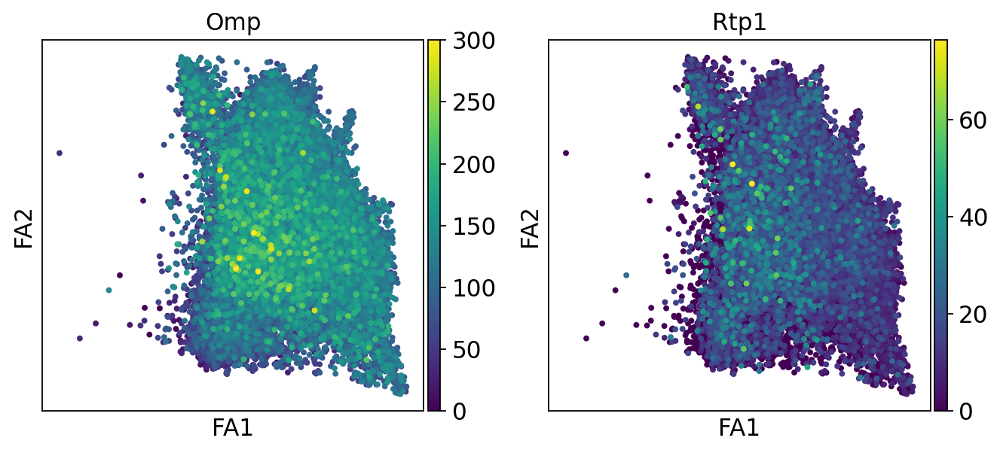

In [16]:
sc.set_figure_params(facecolor='white')
sc.pl.draw_graph(adata, color=['Omp','Rtp1'], legend_loc='on data', size=50)

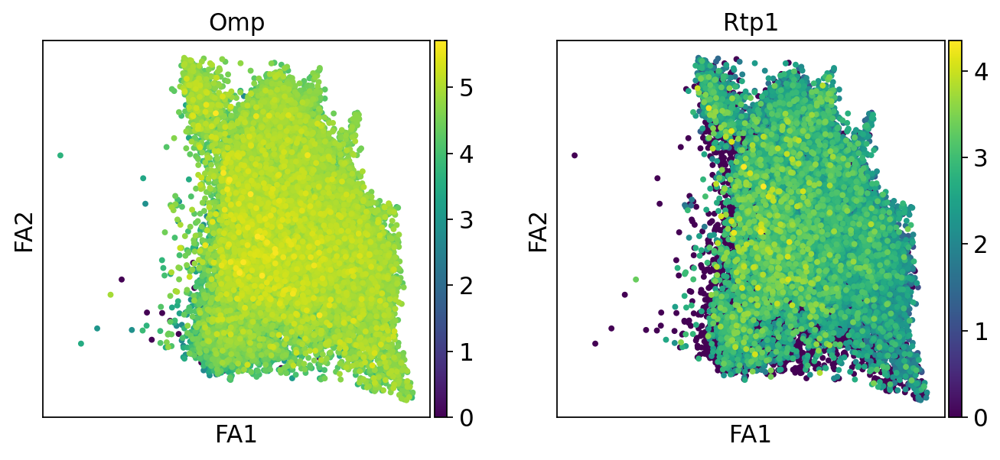

In [17]:
sc.pl.draw_graph(adata_processed, color=['Omp','Rtp1'], legend_loc='on data', size=50)

In [18]:
gene_names = GE_functions.get_gene_names(adata)
excluded_genes = GE_functions.get_excluded_genes()

In [22]:
# relative to rtp1
ge_normalized = GE_functions.get_ge_table(adata, gene_names, ge_across='leiden_name')
mse_normalized = GE_functions.get_mse_table(ge_normalized, gene_names)
mse_normalized = mse_normalized.transpose().sort_values('mse')

ge_processed = GE_functions.get_ge_table(adata_processed, gene_names, ge_across='leiden_name')
mse_processed = GE_functions.get_mse_table(ge_processed, gene_names)
mse_processed = mse_processed.transpose().sort_values('mse')

mse_table constructed
mse_table constructed


In [61]:
ge_combined = ge_normalized.drop(columns = ['index', 'dpt_average']).transpose().rename(
    columns = {0: 'ge_normalized_rtp1'}).join(ge_processed.drop(columns = ['index', 'dpt_average']).transpose().rename(
    columns = {0: 'ge_processed_rtp1'}))
ge_combined.to_csv('./output/brann/ge_combined_Rtp1_mOSN.csv')

In [89]:
mse_combined = mse_normalized.rename(columns = {'mse': 'mse_normalized_rtp1'}).join(
    mse_processed.rename(columns = {'mse': 'mse_processed_rtp1'}))
# mse_combined.to_csv('./output/brann/MSE_gene_combined_Rtp1_mOSN.csv')

In [133]:
# quick plot to visualize the gene list between mOSN and GBC_iOSN
mse_GBC_iOSN_normalized = pd.read_csv('./output/brann/MSE_genes_combined_Rtp1_GBC_iOSN.csv', 
                                      index_col=[0])[['mse_normalized_rtp1']].rename(
                                    columns = {'mse_normalized_rtp1': 'mse_GBC_iOSN_normalized'})
mse_mOSN_normalized = pd.read_csv('./output/tsukahara/MSE_gene_combined_Rtp1_mOSN.csv', 
                                      index_col=[0])[['mse_normalized_rtp1']].rename(
                                    columns = {'mse_normalized_rtp1': 'mse_mOSN_normalized'})

In [64]:
# join method outer preserves genes not included in either list 
mse_combined = mse_GBC_iOSN_normalized.join(mse_mOSN_normalized, how='outer')
mse_combined.to_csv('./output/brann/MSE_genes_normalized_ALL_rtp1.csv')
mse_combined = pd.read_csv('./output/brann/MSE_genes_normalized_ALL_rtp1.csv', index_col=[0])

In [65]:
# generating rank_table
rank_index = []
for i in range(1,len(mse_combined)+1):
    rank_index.append(i)

In [67]:
rank_GBC_iOSN_normalized = pd.DataFrame(index = mse_combined['mse_GBC_iOSN_normalized'].sort_values().index)
rank_GBC_iOSN_normalized['mse_rank_GBC_iOSN_normalized'] = rank_index
rank_mOSN_normalized = pd.DataFrame(index = mse_combined['mse_mOSN_normalized'].sort_values().index)
rank_mOSN_normalized['mse_rank_mOSN_normalized'] = rank_index
rank_combined = rank_GBC_iOSN_normalized.join(rank_mOSN_normalized)
rank_combined.to_csv('./output/brann/Rank_gene_normalized_ALL_rtp1.csv')

In [6]:
rank_combined = pd.read_csv('./output/brann/Rank_gene_normalized_ALL_rtp1.csv', index_col=[0])

In [224]:
rank_combined.loc['Omp']

rank_GBC_iOSN_normalized    16304
rank_mOSN_normalized        16176
Name: Omp, dtype: int64

In [10]:
fig = GE_functions.rank_plot(rank_combined, 
                             title = "mOSN vs GBC_iOSN normalized rank relative to Rtp1",
                             excluded_genes=excluded_genes)
fig.show()
# fig.write_html("./output/brann/Scatter_rank_normalized_processed_rtp1.html")

In [43]:
ge_combined.sort_values('ge_normalized_rtp1')

,ge_normalized_rtp1,ge_processed_rtp1
Obox3-ps8,0.000077,0.000048
Trbv12-1,0.000082,0.000051
Hgf,0.000083,0.000051
Vmn1r13,0.000084,0.000051
Csf3,0.000085,0.000052
...,...,...
Omp,98.590851,4.500503
Stoml3,110.780922,4.547747
Malat1,126.266319,4.537256
S100a5,217.948029,4.715179


In [44]:
# generating rank_table
# rank_combined = ge_combined.copy()
rank_index = []
for i in range(1,len(ge_combined)+1):
    rank_index.append(i)

In [62]:
rank_mOSN_normalized = pd.DataFrame(index = ge_combined['ge_normalized_rtp1'].sort_values(
    ascending=False).index)
rank_mOSN_normalized['ge_rank_normalized_rtp1'] = rank_index
rank_mOSN_processed = pd.DataFrame(index = ge_combined['ge_processed_rtp1'].sort_values(
    ascending=False).index)
rank_mOSN_processed['ge_rank_processed_rtp1'] = rank_index
rank_combined = rank_mOSN_normalized.join(rank_mOSN_processed)
rank_combined.to_csv('./output/brann/Rank_gene_combined_mOSN_rtp1.csv')

In [60]:
fig = GE_functions.rank_plot(rank_combined, 
                             title = "mOSN normalized vs processed average expression rank",
                             excluded_genes=excluded_genes)
fig.show()
fig.write_html("./output/brann/Scatter_rank_ge_combined_rtp1.html")

In [58]:
rank_combined.loc['Rtp1']

ge_normalized_rtp1    171
ge_processed_rtp1     163
Name: Rtp1, dtype: int64